In [3]:
import pandas as pd
import re
import spacy
import nltk
from nltk.corpus import stopwords
from langdetect import detect


# Carica i dati
url = 'https://raw.githubusercontent.com/zfz/twitter_corpus/master/full-corpus.csv'
df = pd.read_csv(url)
data = df['TweetText'].tolist()

stop_words_dict = {
    'en': set(stopwords.words('english')),     # Inglese
}


# Funzione per pulire i tweet
def clean_tweet(text):
    text =re.sub(r'http\S+|https\S+', '', text) # Rimuovere link
    text = re.sub(r'@(\w+)', '', text)    # Rimuovere menzioni (@username)
    text = re.sub(r'#\w+', '', text) # Rimuovere hashtag
    text = re.sub(r'[^\w\s]', '', text)# Rimuovere qualsiasi carattere che non sia alfanumerico o uno spazio
    text = text.lower() 
    
    return text


# Rimozione stopwords
def remove_stopwords(text, lang):
    if lang in stop_words_dict:
        stop_words = stop_words_dict[lang]
        return ' '.join([word for word in text.split() if word.lower() not in stop_words])
    else:
        return ''

In [4]:
frase = "Yesterday sono andato al mercato to buy some fresh frutta and vegetables"
frase_cleaned = clean_tweet(frase)
l = detect(frase_cleaned)
frase_cleaned = remove_stopwords(frase_cleaned, l)
print(frase_cleaned)

yesterday sono andato al mercato buy fresh frutta vegetables


In [5]:
# Pre-elaborazione dei tweet
data_cleaned = []
for tweet in data:
    try:
        # Pulizia del tweet
        cleaned_tweet = clean_tweet(tweet)
        # Rileva la lingua
        lang = detect(cleaned_tweet)
        # Rimozione stop words in base alla lingua rilevata
        cleaned_tweet = remove_stopwords(cleaned_tweet, lang)
        if cleaned_tweet:  # Controlla se la stringa non è vuota
            data_cleaned.append(cleaned_tweet)
    except:
        continue  # Ignora tweet con errore nella rilevazione della lingua
print("Tweet originale:", data[:10])
print("Tweet pulito:", data_cleaned[:10])

Tweet originale: ['Now all @Apple has to do is get swype on the iphone and it will be crack. Iphone that is', '@Apple will be adding more carrier support to the iPhone 4S (just announced)', "Hilarious @youtube video - guy does a duet with @apple 's Siri. Pretty much sums up the love affair! http://t.co/8ExbnQjY", '@RIM you made it too easy for me to switch to @Apple iPhone. See ya!', 'I just realized that the reason I got into twitter was ios5 thanks @apple', "I'm a current @Blackberry user, little bit disappointed with it! Should I move to @Android or @Apple @iphone", 'The 16 strangest things Siri has said so far. I am SOOO glad that @Apple gave Siri a sense of humor! http://t.co/TWAeUDBp via @HappyPlace', 'Great up close & personal event @Apple tonight in Regent St store!', 'From which companies do you experience the best customer service aside from @zappos and @apple?', 'Just apply for a job at @Apple, hope they call me lol']
Tweet pulito: ['get swype iphone crack iphone', 'adding c

In [6]:
# Lemmatizzazione - Carica modelli per ogni lingua
nlp_models = {
    'en': spacy.load("en_core_web_sm"),
}

def lemmatize_text(text, lang):
    if lang in nlp_models:
        doc = nlp_models[lang](text)
        return ' '.join([token.lemma_ for token in doc if not token.is_stop])
    return text  # Restituisce il testo originale se non è supportato

# Lemmatizzazione dei dati puliti
data_lemmatized = []
for tweet in data_cleaned:
    try:
        lang = detect(tweet)
        lemmatized_tweet = lemmatize_text(tweet, lang)
        data_lemmatized.append(lemmatized_tweet)
    except:
        continue 
        
data_lemmatized = [tweet for tweet in data_lemmatized if isinstance(tweet, str) and tweet]
print("Tweet lemmatizzati:", data_lemmatized[:10])
print("Numero di tweet lemmatizzati:", len(data_lemmatized))

Tweet lemmatizzati: ['swype iphone crack iphone', 'add carrier support iphone 4s announce', 'hilarious video guy duet siri pretty sum love affair', 'easy switch iphone ya', 'realize reason get twitter ios5 thank', 'm current user little bit disappointed', '16 strangest things siri said far sooo glad gave siri sense humor via', 'great close personal event tonight regent st store', 'company experience good customer service aside', 'apply job hope lol']
Numero di tweet lemmatizzati: 3308


In [7]:
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"


In [50]:
from bertopic import BERTopic
from gensim.models import CoherenceModel
from gensim.corpora import Dictionary

b_topic_model = BERTopic(nr_topics = 30)
b_topics, probabilities = b_topic_model.fit_transform(data_cleaned)

b_topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,1282,-1_rt_new_iphone_phone,"[rt, new, iphone, phone, get, users, one, sand...",[steve ballmer bunch new nokia windows phones ...
1,0,346,0_phone_nexus_galaxy_new,"[phone, nexus, galaxy, new, windows, android, ...",[microsoft stores offer free windows phone 7 d...
2,1,296,1_rt_twitter_followers_follow,"[rt, twitter, followers, follow, facebook, put...","[put twitter autopilot let gain followers 1, p..."
3,2,200,2_iphone_4s_battery_ios,"[iphone, 4s, battery, ios, ios5, million, ipad...",[rt iphone 4s first weekend sales top four mil...
4,3,193,3_bed_sleep_im_night,"[bed, sleep, im, night, addicted, eclipsed, lo...",[high mother fucker im addicted cant even go s...
5,4,137,4_sandwich_cream_ice_nexus,"[sandwich, cream, ice, nexus, galaxy, android,...","[ice cream sandwich android, ice cream sandwic..."
6,5,110,5_steve_ballmer_jobs_ceo,"[steve, ballmer, jobs, ceo, lucky, sometimes, ...",[ceo steve ballmer buying sometimes youre luck...
7,6,94,6_store_customer_macbook_service,"[store, customer, macbook, service, line, geni...",[rt wow worst customer service experience ever...
8,7,85,7_ebook_pdf_training_nov,"[ebook, pdf, training, nov, sign, rules, ms, o...","[echelon quality management system pdf ebook, ..."
9,8,66,8_siri_voice_4s_iphone,"[siri, voice, 4s, iphone, bidirectional, speec...","[iphone 4s siri doesnt work shit, siri, siri a..."


In [51]:
bert_topics = b_topic_model.get_topics()
# Preparare i dati per Gensim
topic_w = [doc.split() for doc in data_cleaned]
bert_id2word = Dictionary(topic_w)
bert_corpus = [bert_id2word.doc2bow(text) for text in topic_w]

In [52]:
b_topic_model.visualize_barchart(top_n_topics=10)

In [53]:
b_topic_model.visualize_topics()


In [54]:
from g2t.graph2topictm import evaluate

td_score, cv_score, npmi_score = evaluate(data_cleaned, b_topics, bert_topics)
print(f"Diversità dei temi: {td_score}, Coerenza c_v: {cv_score}, Coerenza NPMI: {npmi_score}")

Diversità dei temi: 0.91, Coerenza c_v: 0.7418424803687681, Coerenza NPMI: 0.1586743005596372


In [55]:
from g2t.graph2topictm import Graph2TopicTM
from g2t.graph2topictm import _calculate_topic_diversity, _calculate_cv_npmi

tm = Graph2TopicTM(dataset=data_cleaned, num_topics= 30,
                embedding='princeton-nlp/unsup-simcse-bert-base-uncased')
g2T_prediction = tm.train()
g2T_topics = tm.get_topics()
print(f'Topics: {g2T_topics}')

# Evaluate
g2T_td = _calculate_topic_diversity(g2T_topics)
g2T_cv, g2T_npmi = _calculate_cv_npmi(data_cleaned, g2T_prediction, g2T_topics)

# Print the results
print(f"Topic Diversity Score: {g2T_td}")
print(f"Coherence (c_v) Score: {g2T_cv}")
print(f"Coherence (NPMI) Score: {g2T_npmi}")

Initialize G2T with num_topics=30, embedding=princeton-nlp/unsup-simcse-bert-base-uncased, dim_size=5, graph_method=greedy_modularity
---creating embedding---


3309it [05:18, 10.40it/s]


---Detect 80 Topcis---
====== Using TFIDF_IDFi ======
Topics: {0: [('shit', 0.007942569727914319), ('fuck', 0.006122765945552562), ('bitch', 0.005734612076154316), ('hell', 0.005719685092347695), ('working', 0.005695886648065887), ('fucking', 0.004792678069889482), ('problem', 0.00443632832269874), ('perks', 0.004196720021457314), ('im', 0.00385304807595739), ('infographic', 0.0036629677531957294)], 1: [('help', 0.007184168688461068), ('learning', 0.006312775950284323), ('online', 0.005881719836896174), ('mpromo', 0.005431363630165549), ('music', 0.0054082366821108455), ('pulls', 0.0052044172771458855), ('pls', 0.005099919346316347), ('industry', 0.0050233149283134704), ('best', 0.005001535623246952), ('playful', 0.004820606401492856)], 2: [('iphone', 0.016263342427337835), ('ios', 0.010923681130945898), ('mac', 0.0102812132083472), ('easy', 0.008335632465793974), ('ios5', 0.007899099647519395), ('ipad', 0.007400120810008214), ('pl', 0.006954419573770012), ('download', 0.00683897266983

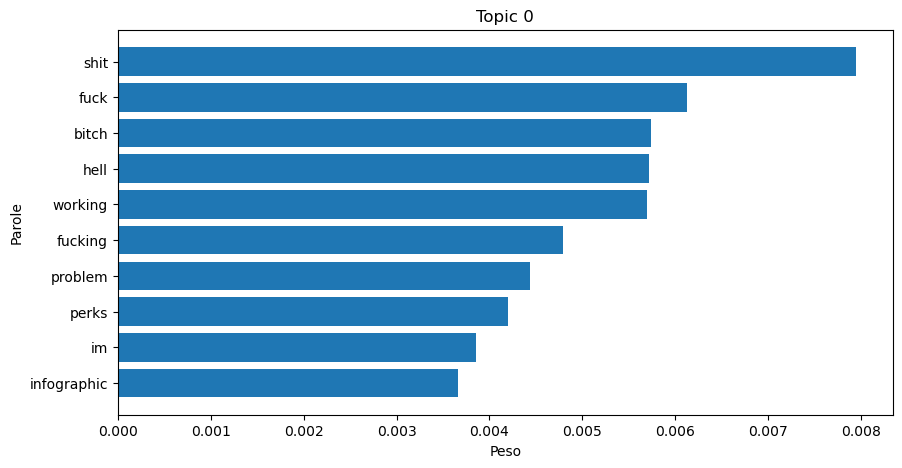

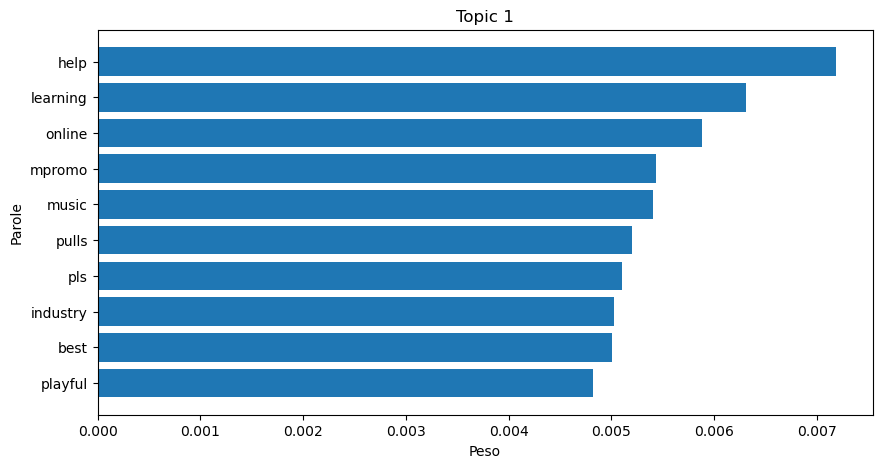

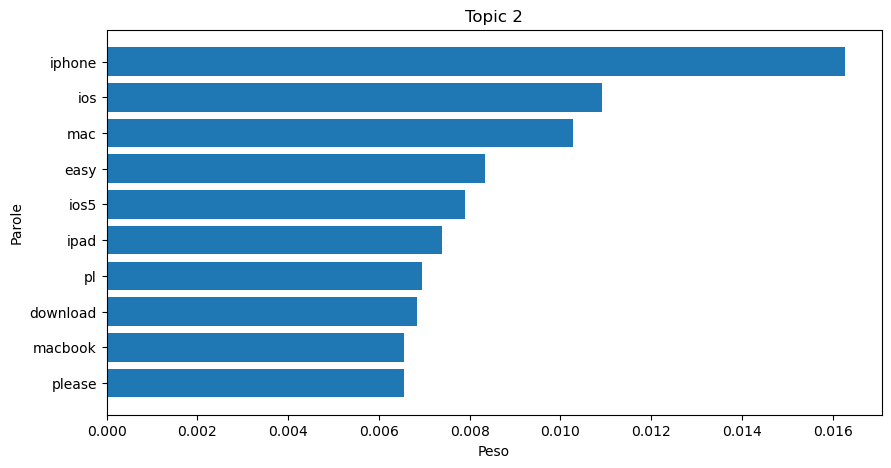

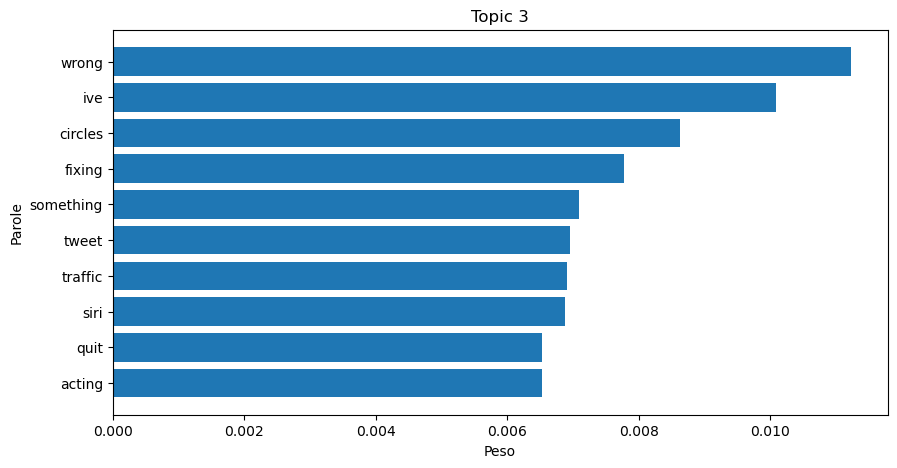

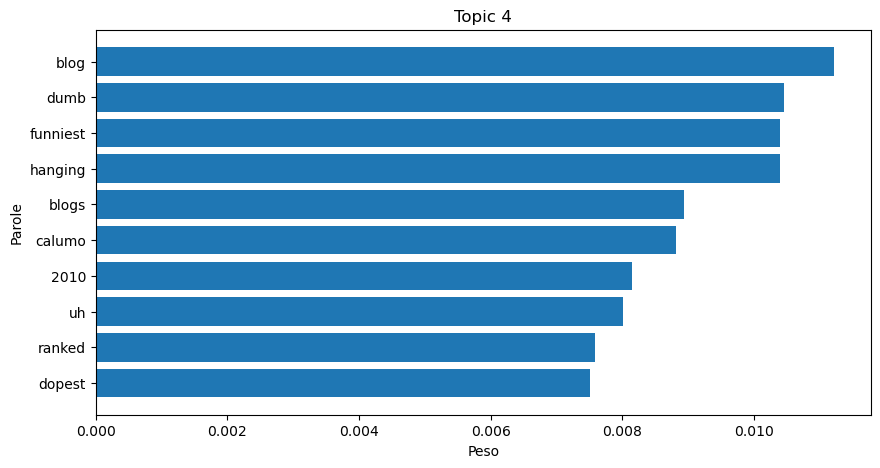

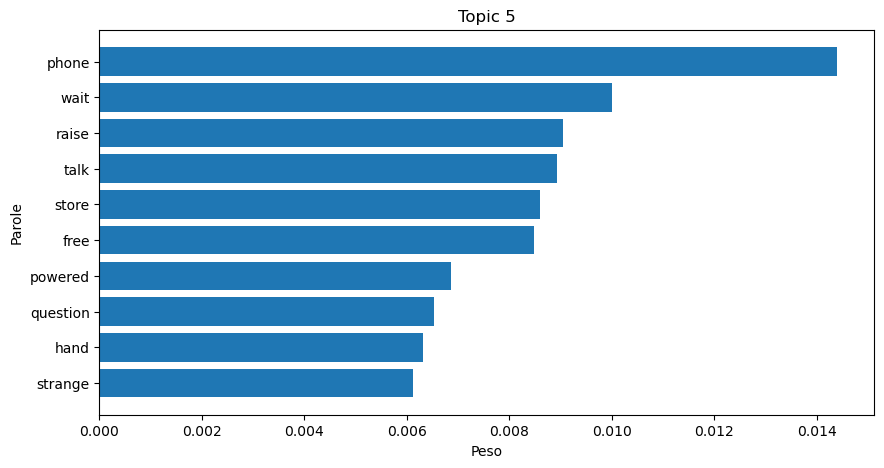

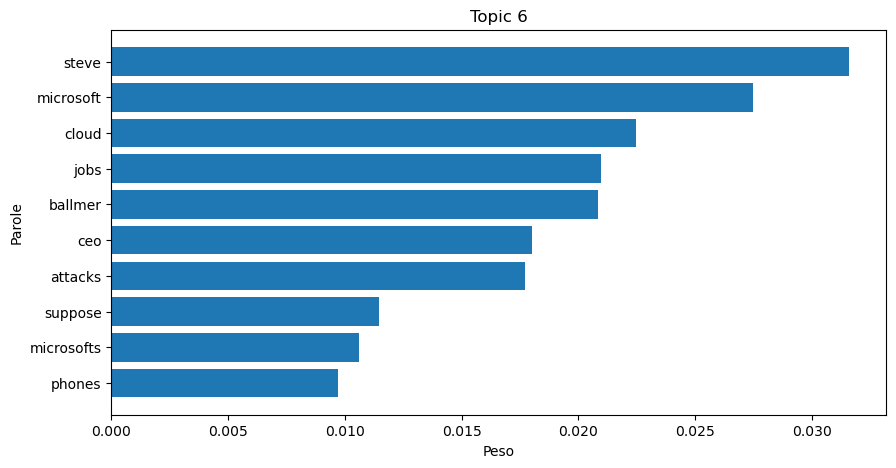

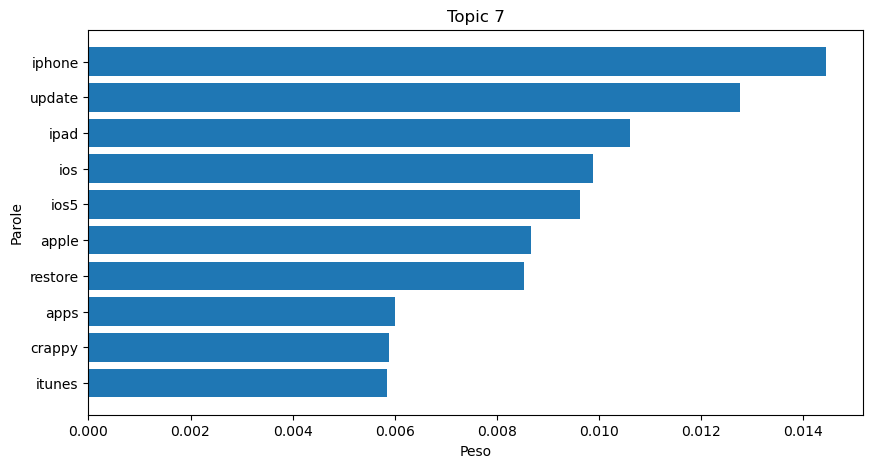

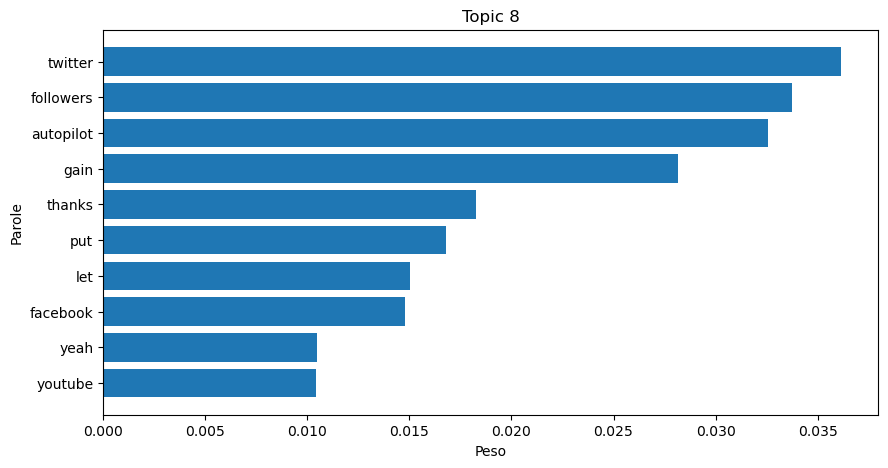

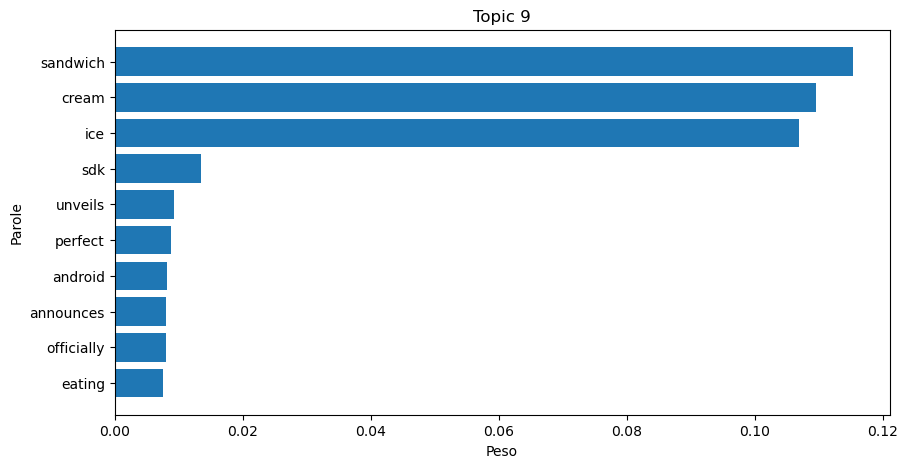

In [56]:
from plot_topics import plot_topics
plot_topics(g2T_topics)

In [57]:
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from pprint import pprint



# Funzione per convertire le frasi in parole
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))


# Accedi correttamente alla colonna
data_words = list(sent_to_words(data_lemmatized))


# Visualizza i primi 30 termini del primo documento
print(data_words[:1][0][:30])



['swype', 'iphone', 'crack', 'iphone']


In [58]:
# Create Dictionary
id2word = corpora.Dictionary(data_words)
# Creare il corpus BoW
texts = data_words
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
# View
print(corpus[:1][0][:30])

# number of topics
num_topics = 30
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)

pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0, 1), (1, 2), (2, 1)]
[(28,
  '0.037*"rt" + 0.024*"new" + 0.015*"iphone" + 0.014*"not" + 0.010*"like" + '
  '0.010*"search" + 0.009*"app" + 0.009*"apple" + 0.007*"release" + '
  '0.007*"update"'),
 (19,
  '0.022*"new" + 0.021*"iphone" + 0.014*"sandwich" + 0.013*"cream" + '
  '0.012*"ice" + 0.010*"user" + 0.010*"not" + 0.009*"microsoft" + '
  '0.008*"apple" + 0.008*"app"'),
 (13,
  '0.014*"rt" + 0.010*"get" + 0.009*"new" + 0.006*"finally" + 0.006*"steve" + '
  '0.006*"come" + 0.006*"thank" + 0.006*"ceo" + 0.006*"ballmer" + '
  '0.006*"microsoft"'),
 (8,
  '0.048*"rt" + 0.016*"new" + 0.012*"great" + 0.009*"phone" + 0.007*"android" '
  '+ 0.007*"work" + 0.007*"get" + 0.006*"send" + 0.006*"touchscreen" + '
  '0.006*"sandwich"'),
 (1,
  '0.036*"rt" + 0.012*"iphone" + 0.010*"day" + 0.009*"not" + 0.009*"hour" + '
  '0.008*"store" + 0.008*"great" + 0.008*"find" + 0.007*"screen" + '
  '0.007*"get"'),
 (3,
  '0.022*"rt" + 0.019*"phone" + 0.015*"not" + 0.013*"new" + 0.011*"ice" + '
  '0.011*"c

In [59]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

pyLDAvis.enable_notebook()

# Prepara i dati per la visualizzazione
LDAvis_prepared = gensimvis.prepare(lda_model, corpus,id2word)

# Visualizza i dati preparati
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
27    -0.129118  0.028093       1        1  4.658217
26    -0.046845 -0.096710       2        1  4.533443
28    -0.025790 -0.029424       3        1  4.513964
1      0.079788 -0.054877       4        1  4.158955
23    -0.083058 -0.005136       5        1  4.125363
19    -0.050201 -0.066028       6        1  4.084494
0     -0.083318 -0.060784       7        1  3.894019
8     -0.023858 -0.021292       8        1  3.844356
16     0.064516  0.034908       9        1  3.840308
10    -0.018685  0.042669      10        1  3.732187
9     -0.075674  0.063666      11        1  3.670047
25    -0.012377  0.010996      12        1  3.441751
4     -0.077857  0.009097      13        1  3.370593
3     -0.066463  0.045367      14        1  3.277743
14     0.055685  0.003894      15        1  3.241584
2      0.024887 -0.044357      16        1  3.149940
7      0.047683  0.025018      17        1  3.123520
5     -0.030832 -0.018674      18        1  2.960887
24    -0.024962  0.097878      19        1  2.956592
18     0.052413 -0.084742      20        1  2.941763
15    -0.041089 -0.007864      21        1  2.941575
11    -0.016906 -0.069083      22        1  2.919488
6      0.076145  0.011445      23        1  2.837497
29     0.112591 -0.037308      24        1  2.657968
13     0.021545  0.070872      25        1  2.656304
21     0.079395  0.049601      26        1  2.600541
22     0.122425  0.034124      27        1  2.586956
20    -0.000696  0.105699      28        1  2.499946
12     0.038941  0.010064      29        1  2.414119
17     0.031715 -0.047111      30        1  2.365881, topic_info=          Term        Freq       Total Category  logprob  loglift
63          rt  389.000000  389.000000  Default  30.0000  30.0000
1683       ice  148.000000  148.000000  Default  29.0000  29.0000
1682     cream  154.000000  154.000000  Default  28.0000  28.0000
1684  sandwich  158.000000  158.000000  Default  27.0000  27.0000
1021     nexus  126.000000  126.000000  Default  26.0000  26.0000
...        ...         ...         ...      ...      ...      ...
217       work    2.553872   59.869767  Topic30  -5.2917   0.5895
46       store    2.553805   95.805096  Topic30  -5.2917   0.1193
459    finally    1.712285   19.620137  Topic30  -5.6914   1.3053
1269      site    1.712258   23.463571  Topic30  -5.6915   1.1264
2176     build    1.712207   20.757987  Topic30  -5.6915   1.2489

[2234 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
1134      5  0.266664        able
1134      8  0.266664        able
1134      9  0.133332        able
1134     21  0.133332        able
1134     29  0.133332        able
...     ...       ...         ...
2922      8  0.586674        جوجل
2923      8  0.586684    لمستخدمي
3014     13  0.606156  トコモandroid
3015     13  0.606153   採用のgalaxy
3016     13  0.606139         月発売

[6394 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[28, 27, 29, 2, 24, 20, 1, 9, 17, 11, 10, 26, 5, 4, 15, 3, 8, 6, 25, 19, 16, 12, 7, 30, 14, 22, 23, 21, 13, 18])

In [60]:
predictions = []
for doc in corpus:
    topic_probs = lda_model.get_document_topics(doc)
    # Extract the topic with the highest probability
    # If no topic, assign -1
    if topic_probs:
        predictions.append(max(topic_probs, key=lambda x: x[1])[0])
    else:
        predictions.append(-1)

# Create a dictionary to map topics to words and their weights
lda_topics = {}
for topic_id in range(num_topics):
    words = lda_model.get_topic_terms(topic_id, topn=10)  # Get top 10 words for each topic
    lda_topics[topic_id] = [(id2word[word_id], weight) for word_id, weight in words]

td_lda, cv_lda, npmi_lda = evaluate(data_lemmatized, predictions, lda_topics)
print(f"Diversità dei temi: {td_lda}, Coerenza c_v: {cv_lda}, Coerenza NPMI: {npmi_lda}")

Diversità dei temi: 0.27666666666666667, Coerenza c_v: 0.40053121705623834, Coerenza NPMI: -0.01377530156457485


In [61]:
lda_model.get_document_topics(doc)

[(0, 0.75830775)]

In [62]:
import Bert_LDA
import importlib  # Importa importlib
importlib.reload(Bert_LDA) 

<module 'Bert_LDA' from '/Users/hongyuxu/Downloads/implementazioni Topic/Bert_LDA.py'>

In [63]:
from Bert_LDA import Topic_Model
from Bert_LDA import get_token_lists

token_lists = get_token_lists(data_lemmatized)
bertlda_m = Topic_Model(k=30, method='LDA_BERT')
bertlda_m.fit(data_lemmatized, token_lists)

Clustering embeddings ...
Getting vector representations for LDA ...
Getting vector representations for LDA. Done!
Getting vector representations for BERT ...


Batches:   0%|          | 0/104 [00:00<?, ?it/s]

Getting vector representations for BERT. Done!
Fitting Autoencoder ...
Fitting Autoencoder Done!
104/104 [==============================] - 0s 1ms/step
Clustering embeddings. Done!


Calculating UMAP projection...
Calculating the Umap projection. Done!


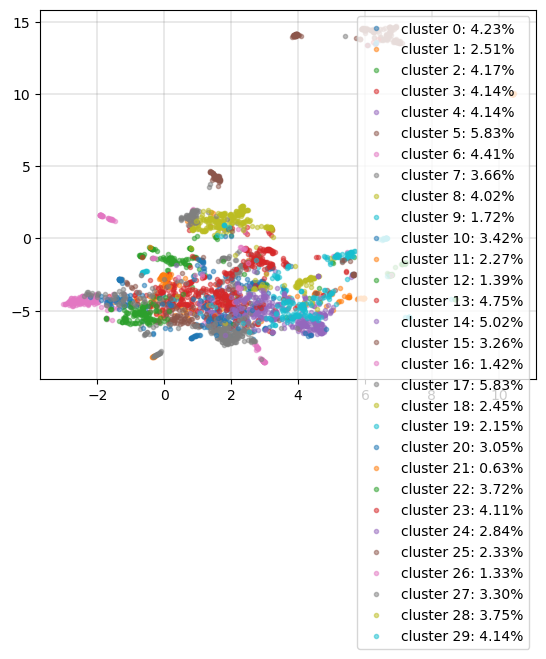

In [64]:
from Bert_LDA import visualize
visualize(bertlda_m)

Getting wordcloud for topic 0 ...


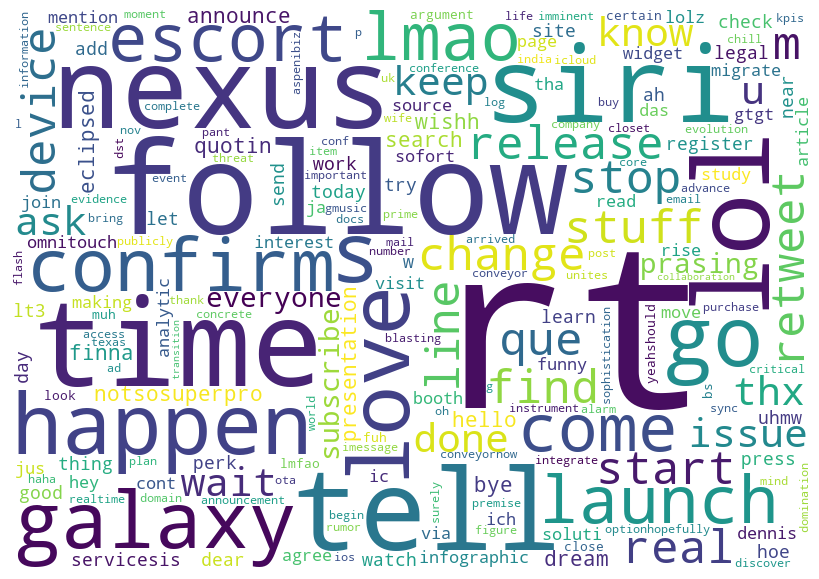

Getting wordcloud for topic 1 ...


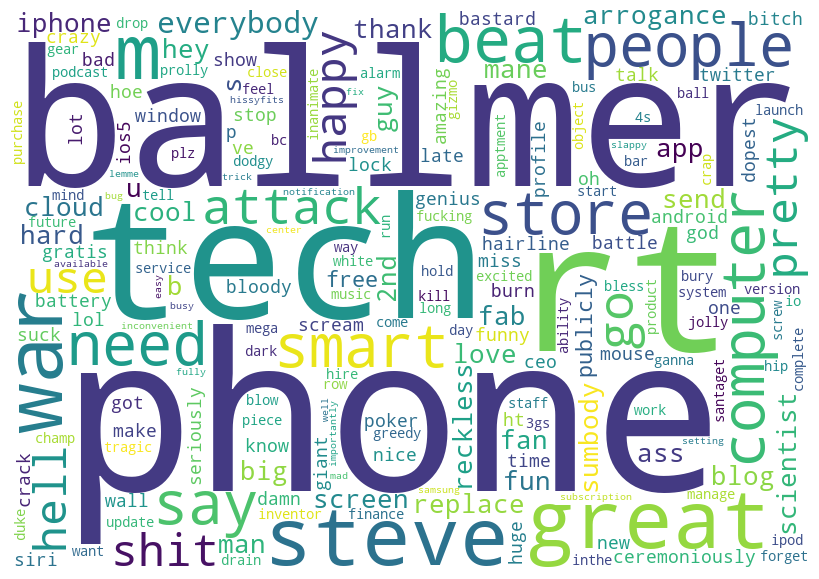

Getting wordcloud for topic 2 ...


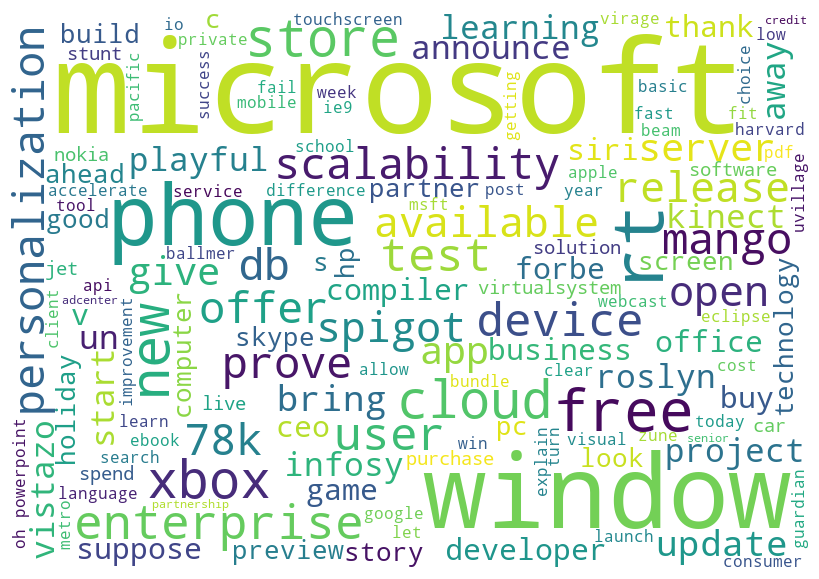

Getting wordcloud for topic 3 ...


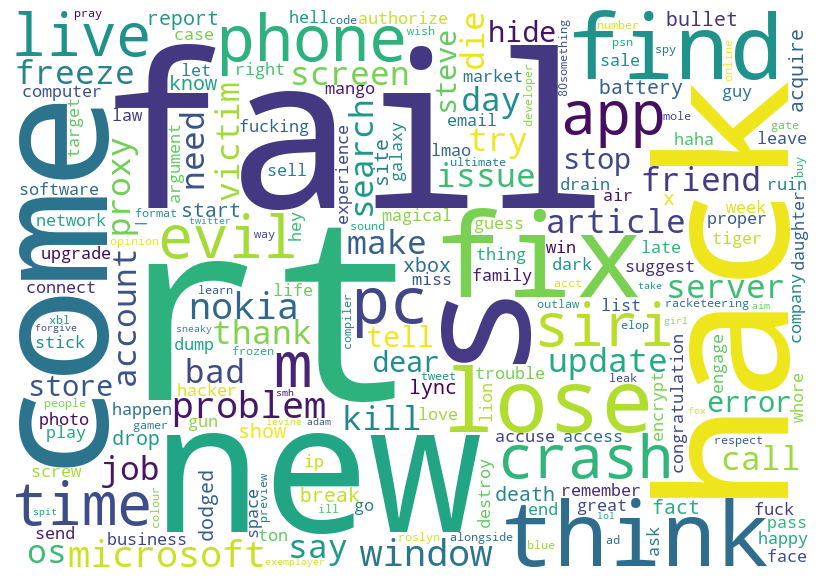

Getting wordcloud for topic 4 ...


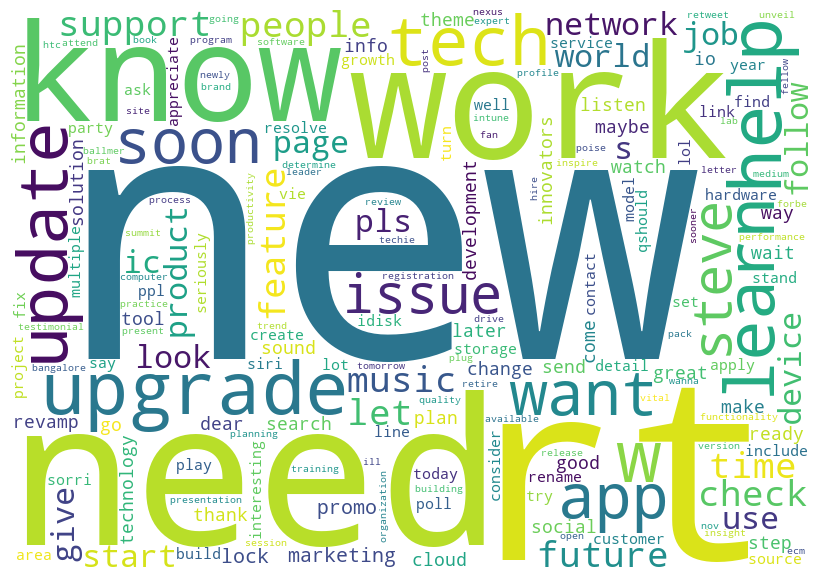

Getting wordcloud for topic 5 ...


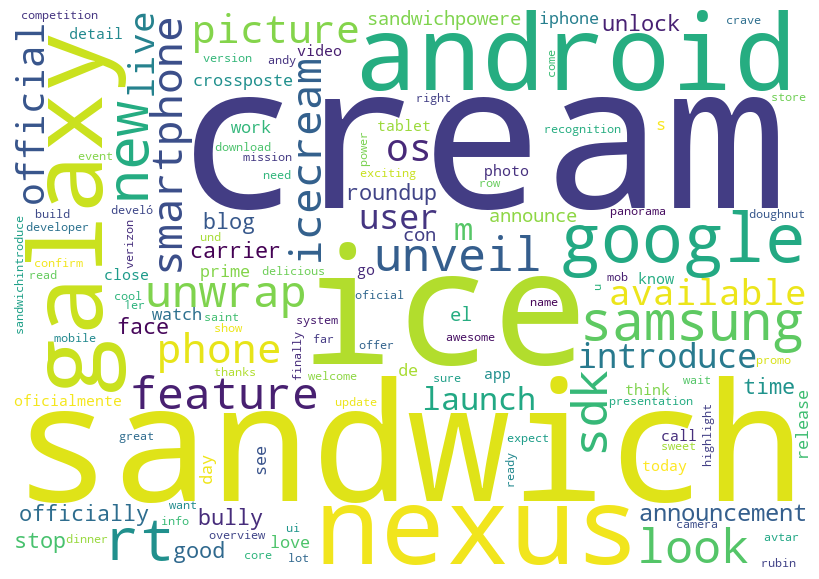

Getting wordcloud for topic 6 ...


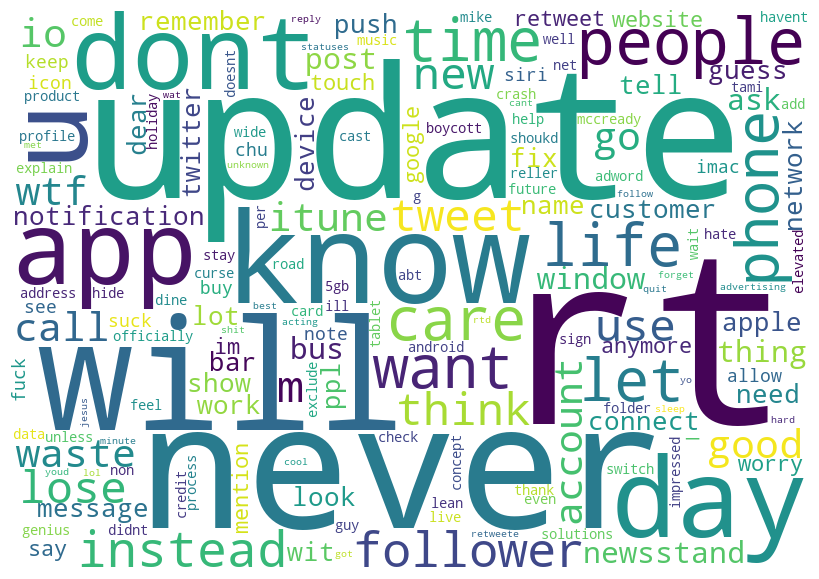

Getting wordcloud for topic 7 ...


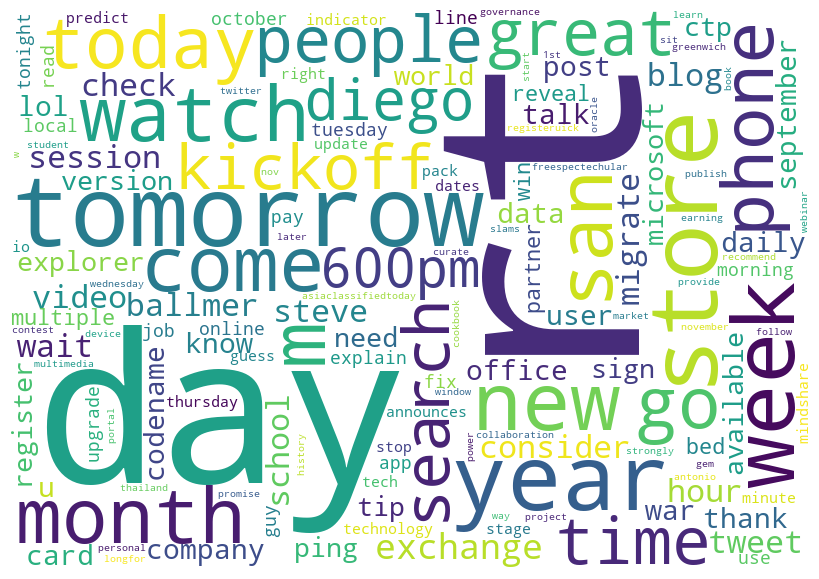

Getting wordcloud for topic 8 ...


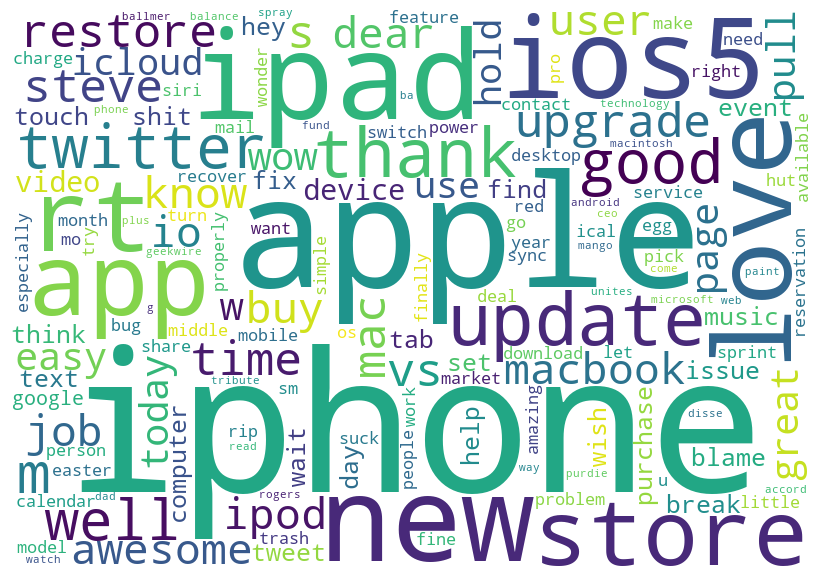

Getting wordcloud for topic 9 ...


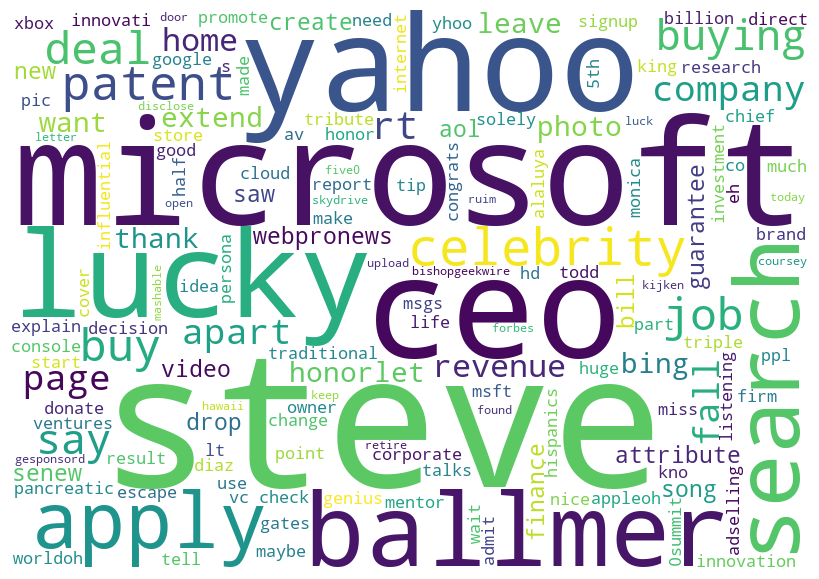

Getting wordcloud for topic 10 ...


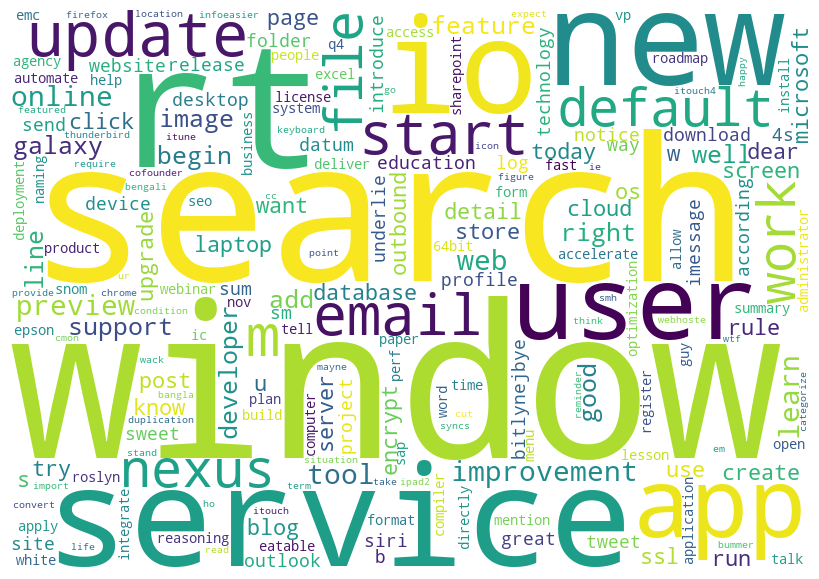

Getting wordcloud for topic 11 ...


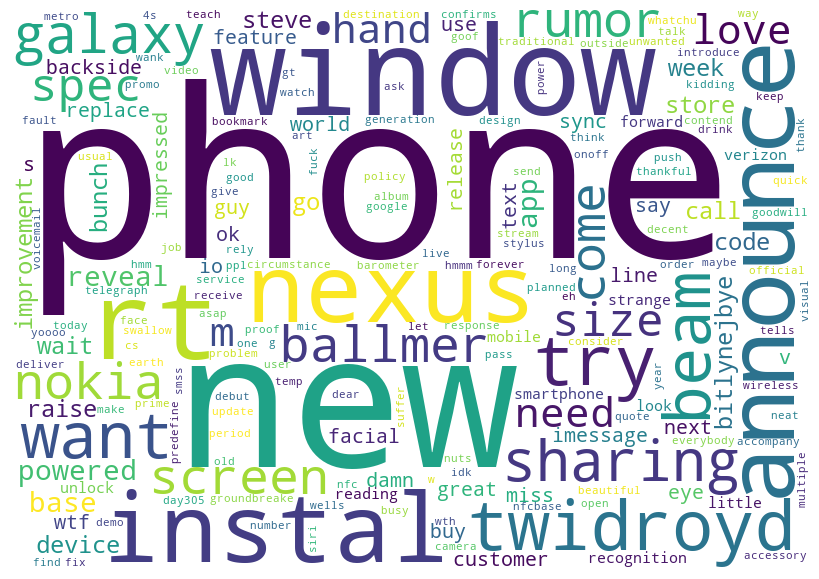

Getting wordcloud for topic 12 ...


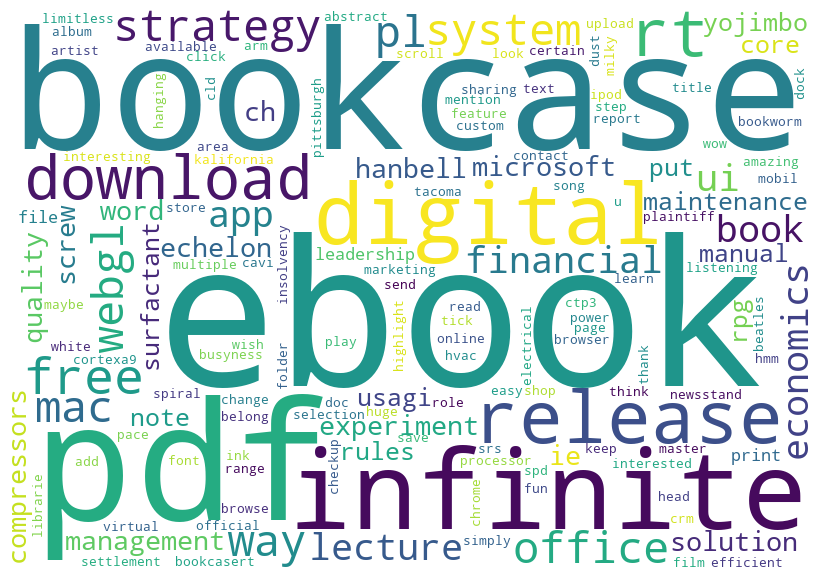

Getting wordcloud for topic 13 ...


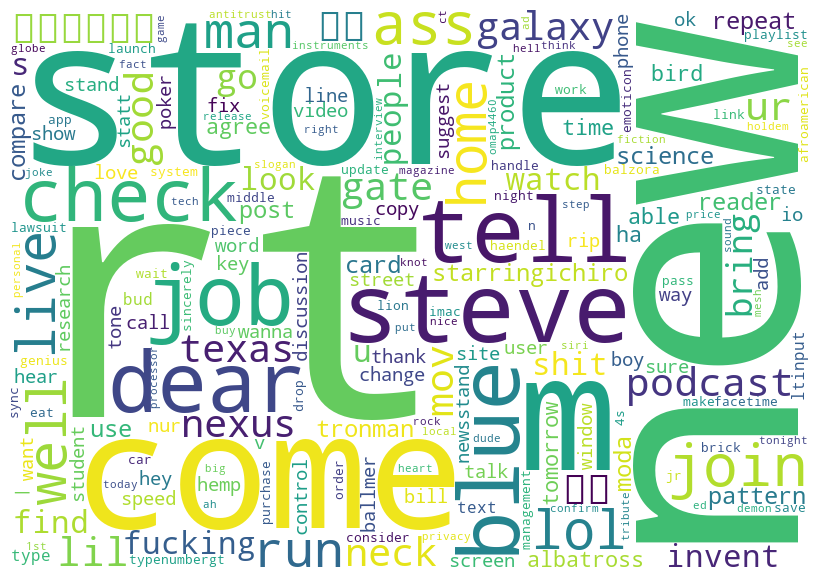

Getting wordcloud for topic 14 ...


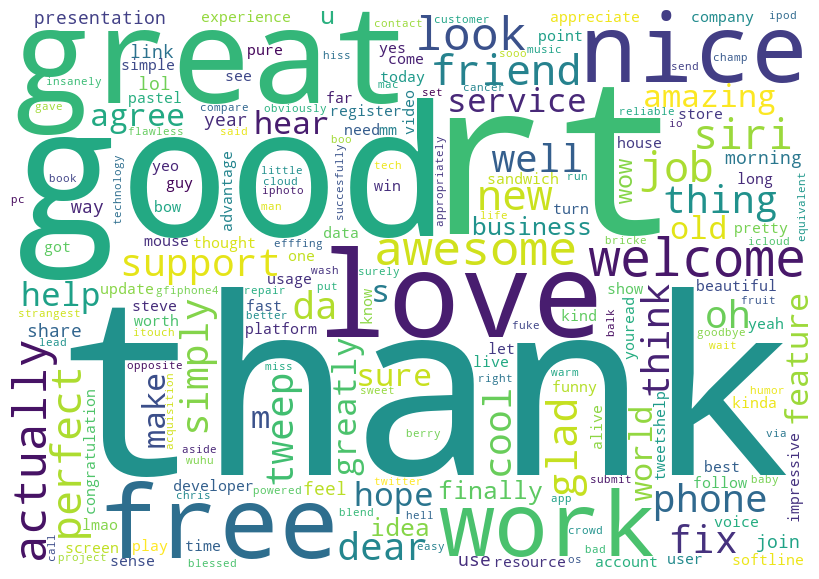

Getting wordcloud for topic 15 ...


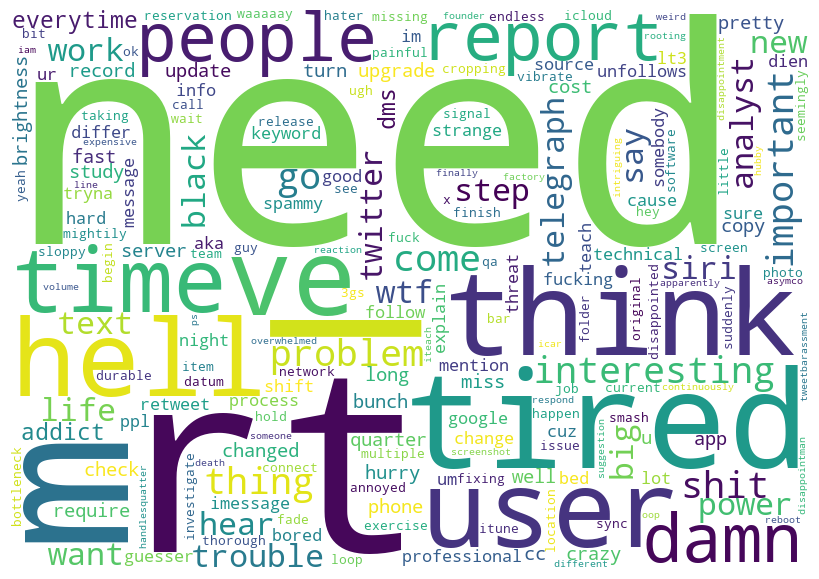

Getting wordcloud for topic 16 ...


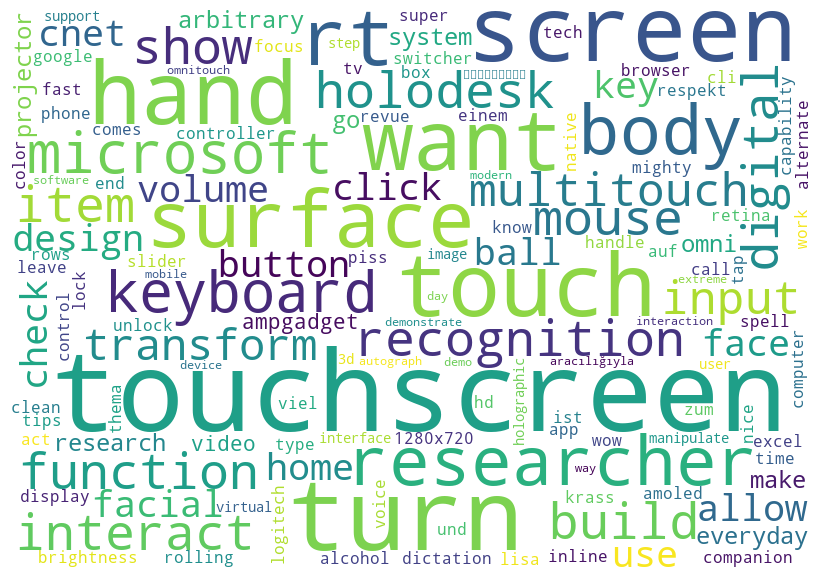

Getting wordcloud for topic 17 ...


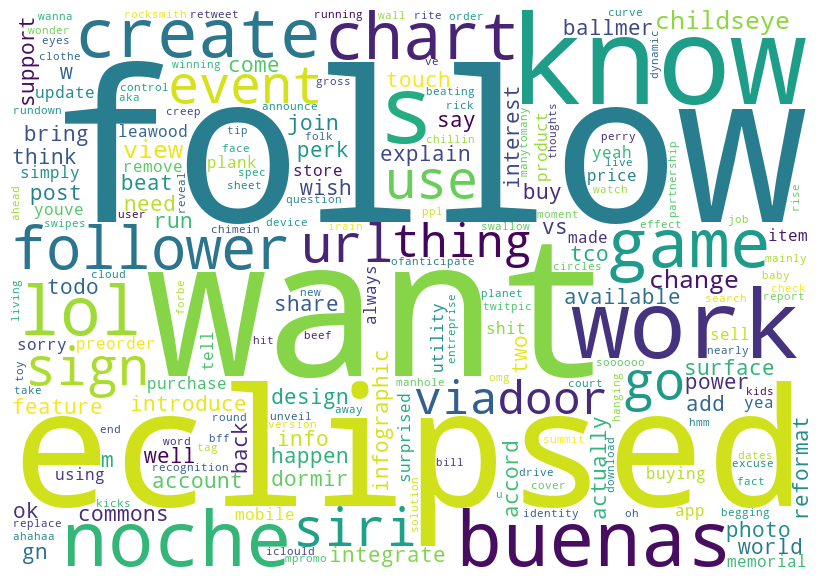

Getting wordcloud for topic 18 ...


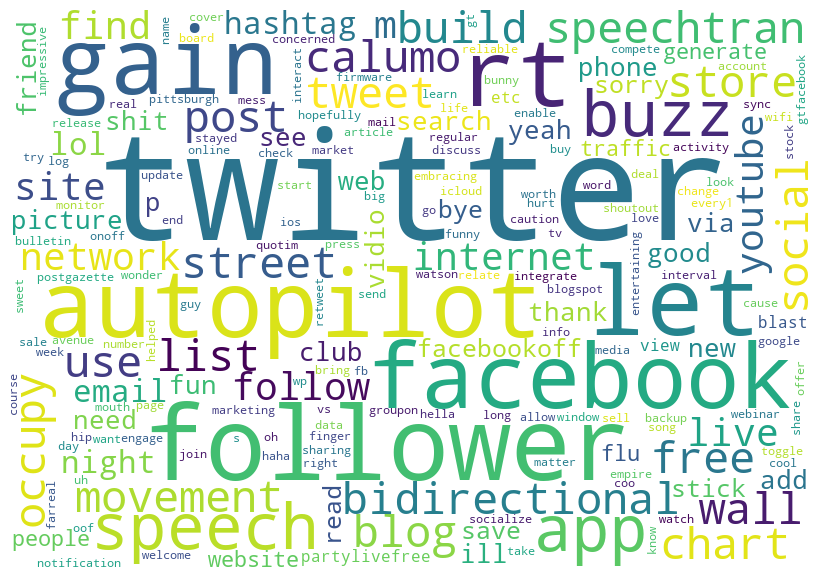

Getting wordcloud for topic 19 ...


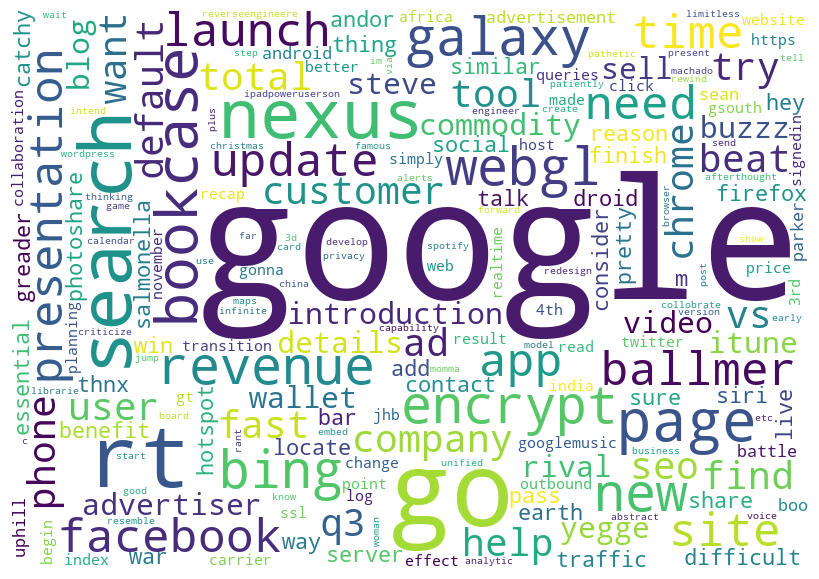

Getting wordcloud for topic 20 ...


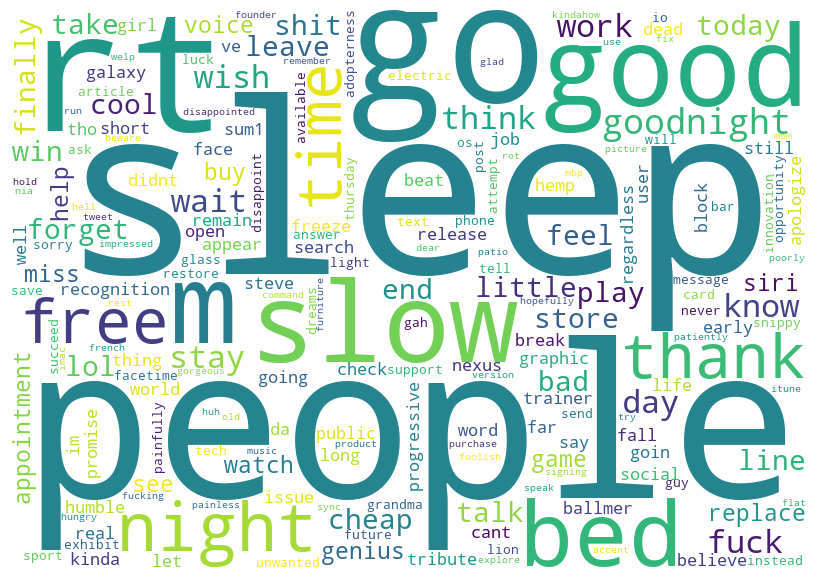

Getting wordcloud for topic 21 ...


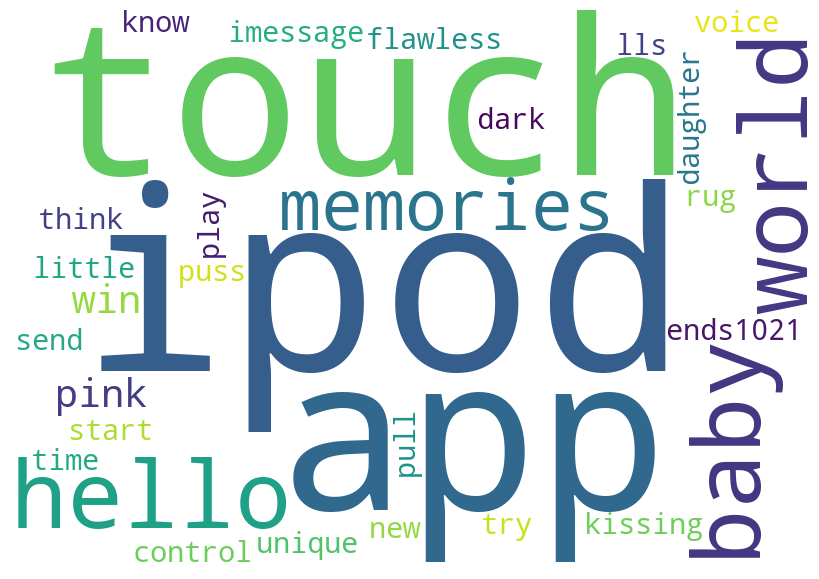

Getting wordcloud for topic 22 ...


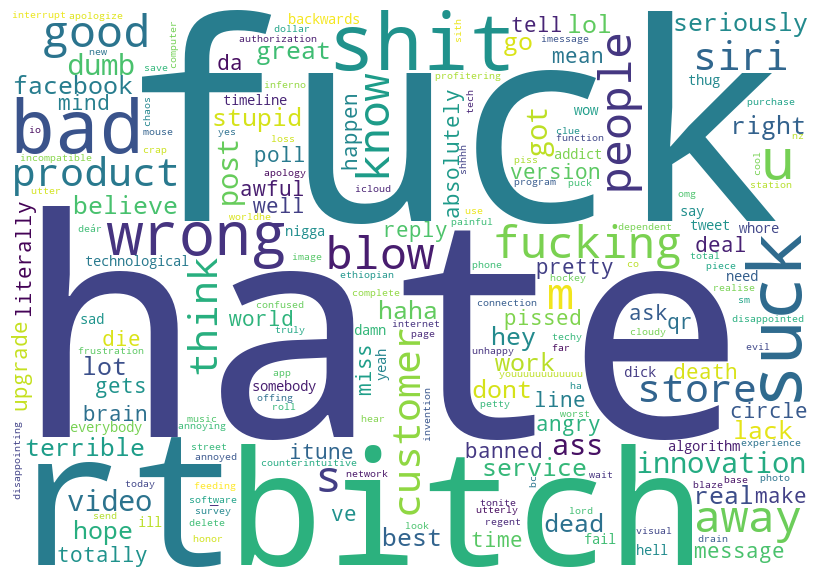

Getting wordcloud for topic 23 ...


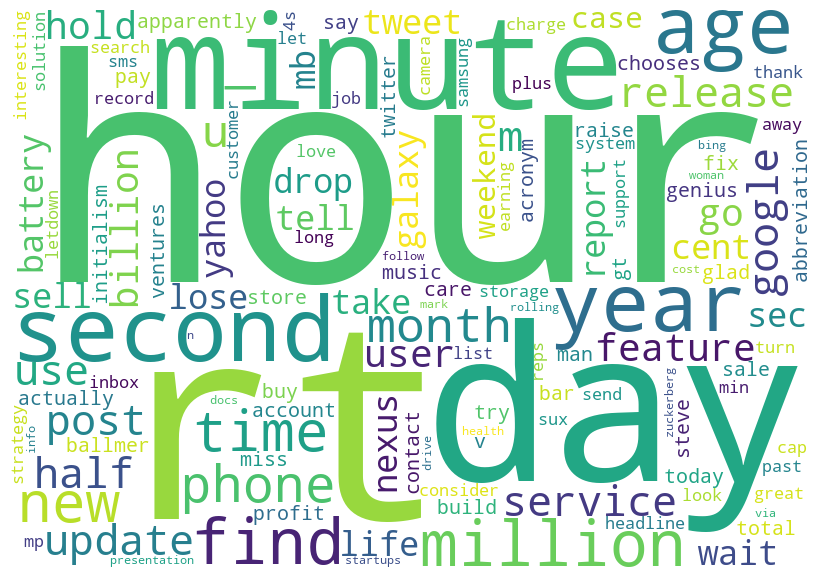

Getting wordcloud for topic 24 ...


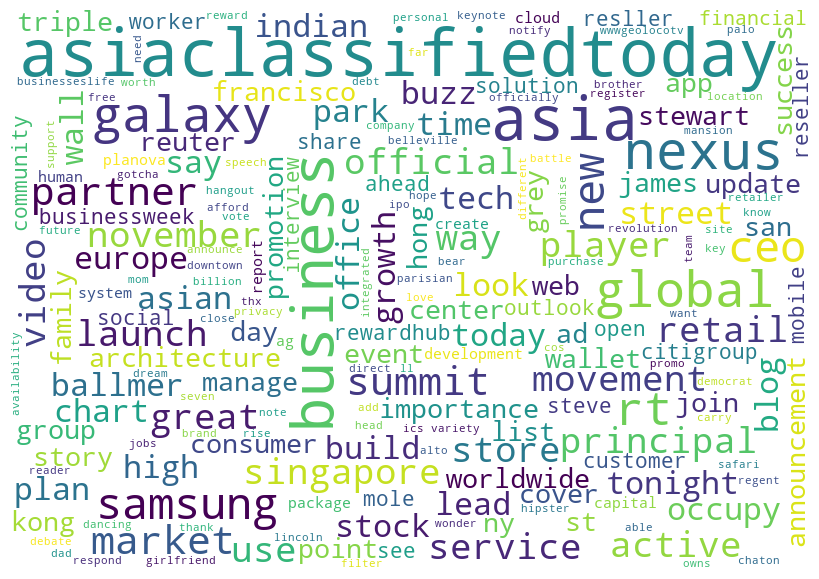

Getting wordcloud for topic 25 ...


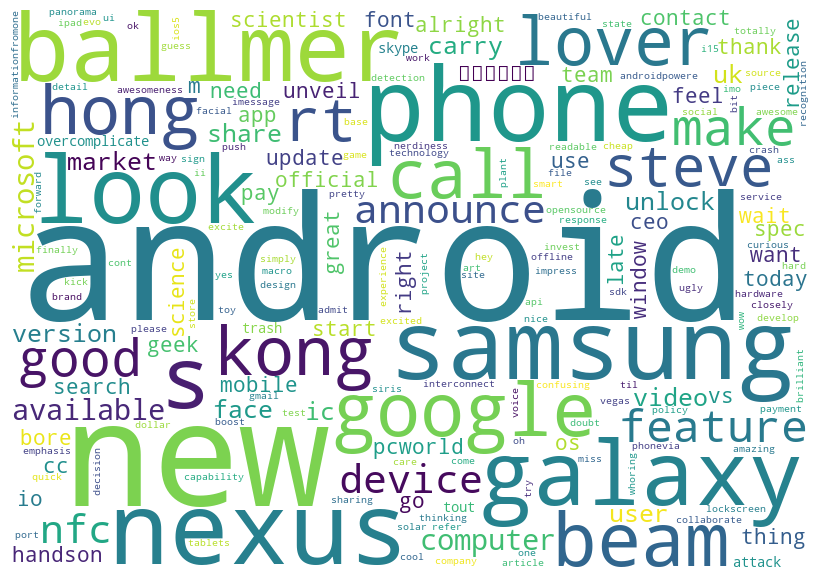

Getting wordcloud for topic 26 ...


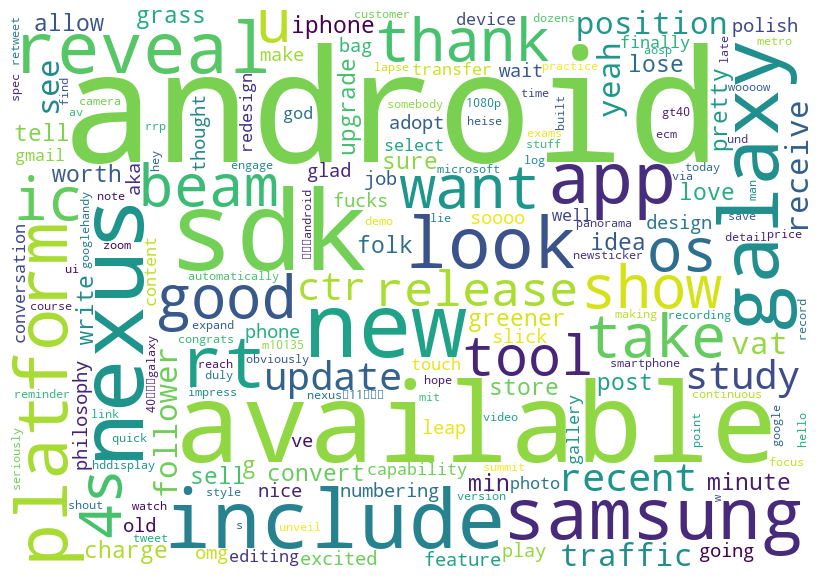

Getting wordcloud for topic 27 ...


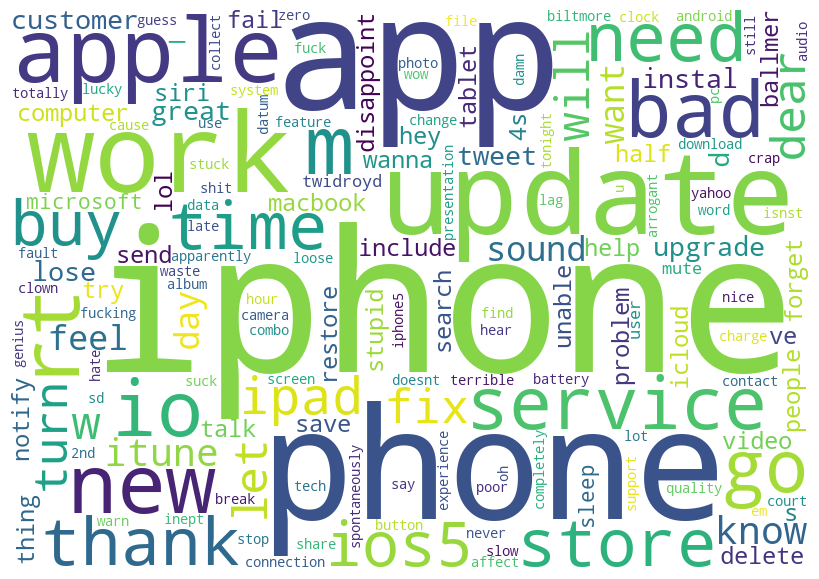

Getting wordcloud for topic 28 ...


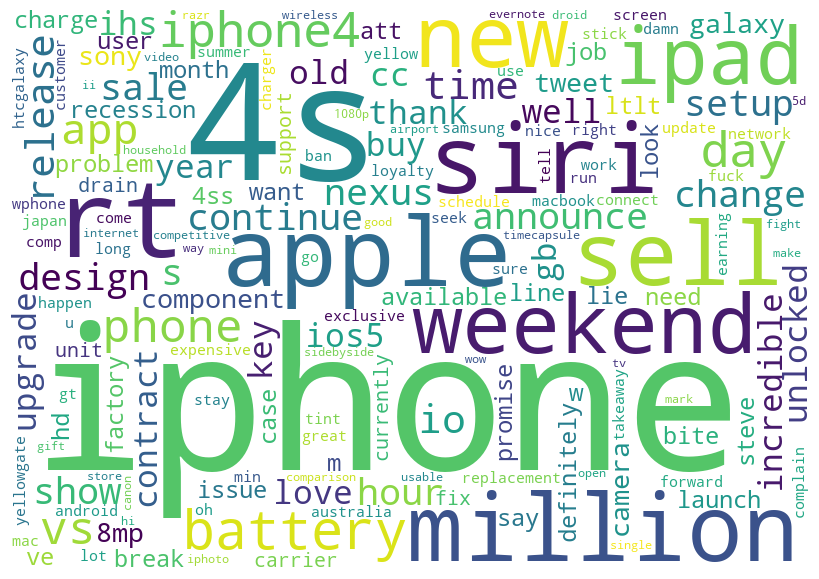

Getting wordcloud for topic 29 ...


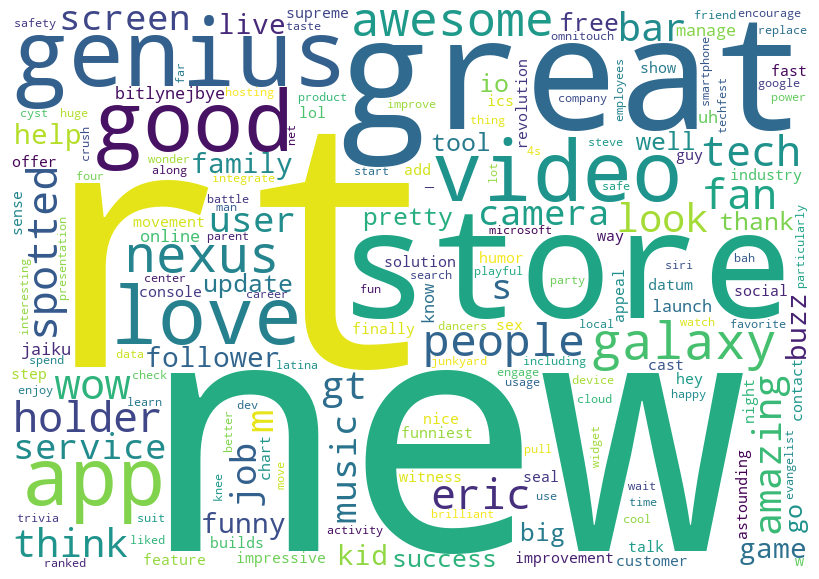

In [65]:
from Bert_LDA import get_wordcloud
for i in range(bertlda_m.k):
        get_wordcloud(bertlda_m, token_lists, i)

In [66]:
from Bert_LDA import get_topic_words

ldabert_dict= {}
ldabert_topics = get_topic_words(token_lists, bertlda_m.cluster_model.labels_)

for i in range(bertlda_m.k):
    ldabert_dict[i] = ldabert_topics[i]


print(ldabert_dict)

{0: ['rt', 'follow', 'like', 'tell', 'time', 'nexus', 'siri', 'lol', 'happen', 's'], 1: ['phone', 'ballmer', 'rt', 'tech', 'great', 'war', 'steve', 'm', '2012', 'like'], 2: ['microsoft', 'phone', 'window', 'rt', 'windows', 'free', 'store', '7', 'xbox', 'cloud'], 3: ['rt', 'fail', 'hack', 's', '2', 'new', 'fix', 'think', 'find', 'lose'], 4: ['new', 'rt', 'need', 'get', 'work', 'like', 'know', 'upgrade', 'w', 'help'], 5: ['cream', 'sandwich', 'ice', 'nexus', 'android', 'galaxy', '40', 'google', 'rt', 'new'], 6: ['not', 'rt', 'update', 'never', 'like', 'will', 'know', 'day', 'u', 'dont'], 7: ['rt', '2010', 'day', 'tomorrow', 'store', 'year', 'week', '2012', '2011', 'new'], 8: ['iphone', 'apple', 'ipad', 'new', 'ios5', 'love', 'rt', 'app', 'store', 'get'], 9: ['steve', 'microsoft', 'ceo', 'yahoo', 'lucky', 'ballmer', 'search', 'apply', 'celebrity', 'patent'], 10: ['window', 'search', 'rt', '8', 'service', 'io', 'new', 'user', 'app', '5'], 11: ['phone', 'new', 'window', 'rt', 'nexus', 'anno

In [67]:
from g2t.graph2topictm import _calculate_topic_diversity
from Bert_LDA import get_coherence_cv
from Bert_LDA import get_coherence_npmi

td_ldaBERT = _calculate_topic_diversity(ldabert_dict)
cv_ldaBERT = get_coherence_cv(bertlda_m, token_lists)
npmi_ldaBERT = get_coherence_npmi(bertlda_m, token_lists)

print(f"Diversità dei temi: {td_ldaBERT}, Coerenza c_v: {cv_ldaBERT}, Coerenza NPMI: {npmi_ldaBERT}")

Diversità dei temi: 0.09666666666666666, Coerenza c_v: 0.37363650508943824, Coerenza NPMI: -0.07937112439602485


In [68]:
data = {
    'LDA_BERT': [td_ldaBERT, cv_ldaBERT, npmi_ldaBERT],
    'Graph2Topic': [g2T_td, g2T_cv, g2T_npmi],
    'BERTopic': [td_score, cv_score, npmi_score],
    'LDA' : [td_lda, cv_lda, npmi_lda]
}

# Creazione del DataFrame e impostazione delle righe
df = pd.DataFrame(data, index=['td', 'cv', 'npmi'])

# Visualizzazione della tabella
df


,LDA_BERT,Graph2Topic,BERTopic,LDA
td,0.096667,0.880000,0.910000,0.276667
cv,0.373637,0.710713,0.741842,0.400531
npmi,-0.079371,0.019256,0.158674,-0.013775


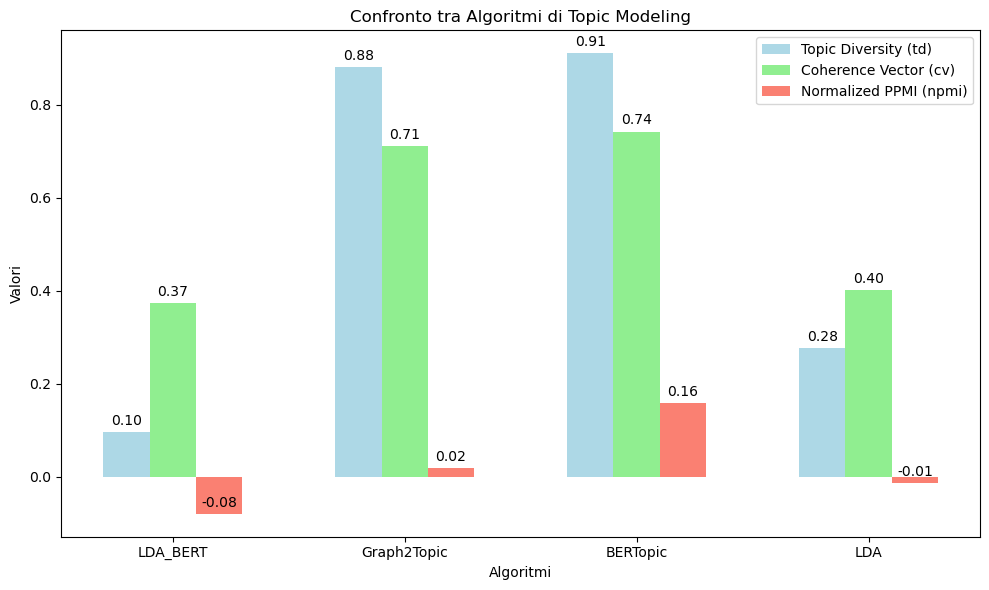

In [69]:
import matplotlib.pyplot as plt
import numpy as np

# Definisco i dati
algorithms = ['LDA_BERT', 'Graph2Topic', 'BERTopic', 'LDA']
td = [td_ldaBERT, g2T_td, td_score, td_lda]
cv = [cv_ldaBERT, g2T_cv, cv_score, cv_lda]
npmi = [npmi_ldaBERT, g2T_npmi, npmi_score, npmi_lda]

# Posizioni delle barre
x = np.arange(len(algorithms))

# Larghezza delle barre
width = 0.2

# Creazione della figura e degli assi
fig, ax = plt.subplots(figsize=(10, 6))

# Creazione delle barre
bars1 = ax.bar(x - width, td, width, label='Topic Diversity (td)', color='lightblue')
bars2 = ax.bar(x, cv, width, label='Coherence Vector (cv)', color='lightgreen')
bars3 = ax.bar(x + width, npmi, width, label='Normalized PPMI (npmi)', color='salmon')

# Aggiunta delle etichette e titolo
ax.set_xlabel('Algoritmi')
ax.set_ylabel('Valori')
ax.set_title('Confronto tra Algoritmi di Topic Modeling')
ax.set_xticks(x)
ax.set_xticklabels(algorithms)
ax.legend()

# Aggiunta delle etichette sopra le barre
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 punti sopra la barra
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels(bars1)
add_labels(bars2)
add_labels(bars3)

# Mostrare il grafico
plt.tight_layout()
plt.show()
